# <center>Unsupervised/Self-Supervised Learning and Generating Images in Keras</center>

In [1]:
# importing required libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, LeakyReLU, Conv2DTranspose, \
Reshape, Conv2D, Flatten, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Sequential, Model

# <center>Dataset - Pulmonary Chest X-Ray Abnormalities</center>

Dataset Reference: https://www.kaggle.com/kmader/pulmonary-chest-xray-abnormalities/home?select=Montgomery

* Tuberclosis is a disease that affects people in developing as well as developed countries. Accurate diagnosis of the disease is crucial for its treatment but in less developed countries, the radiological expertise is missing in assessing the x-rays. The task of manually examining these x-rays is also time consuming. An algorithm that could do these tasks quickly and effectively can drastically improve the ability to diagnose and treat the disease.
* CNNs/Deep Learning has achieved state of the art results in various ML/DL problems and is being implemented in all industries. But one thing that is required for a deep learning model to produce high quality result is large amounts of high quality data.
* For the particular problem of classification of tuberclosis from normal x-rays, due to high requirement of man power and large number of x-ray machines, data is low in amount.
* Therefore, obtaining high performance from a deep learning model becomes challenging.
* If there was a method to generate images similar to the ones provided in the dataset, it could help in much better training of a DL model and hence produce better results.
* This assignment implements 3 such models (methods) which could help in the generation of x-rays which can in-turn be used for training.

In [3]:
# image and its corresponding label folder
label_folder = 'ChinaSet_AllFiles/ChinaSet_AllFiles/ClinicalReadings/'
img_folder = 'ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/'

In [4]:
# listing all the images and labels
label_names = os.listdir(label_folder)
img_names = os.listdir(img_folder)

### Saving data into a Dataframe

In [5]:
# getting labels of each image (extra)
filenames = []
labels = []

for f in label_names:
    temp = f.split('.')[0]
    labels.append(int(temp[-1]))
    filenames.append(temp)

In [6]:
data = pd.DataFrame()
data['Filename'] = filenames
data['Label'] = labels

In [7]:
def mod_col(x):
    '''Assigns abolute path address'''
    return img_folder + x + '.png'

In [8]:
data['Filename'] = data['Filename'].apply(lambda x: mod_col(x))

In [9]:
data.head()

,Filename,Label
0,ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/CH...,0
1,ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/CH...,0
2,ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/CH...,0
3,ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/CH...,0
4,ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/CH...,0


In [10]:
# label of normal data -> 0
# label of tuberclosis data -> 1
normal_data = data[data['Label'] == 0]
tuberclosis_data = data[data['Label'] == 1]

### Displaying Sample Images

In [11]:
def plot_images(d, type_, n_images = 9, nrows = 3, ncols = 3, fig_size = (15,10)):
    '''Functions plots sample images from the dataset'''
    
    assert n_images <= (ncols * nrows)
    
    if type_ == "normal" or type_ == "tuberclosis":
        
        # selecting random images
        sample_indices = random.sample(range(0, len(d)), n_images)
        
        fig = plt.figure(figsize = fig_size)
        for i in range(nrows * ncols):
            
            img_file = d['Filename'].iloc[sample_indices[i]]   
            img_name = d['Filename'].iloc[sample_indices[i]].split('/')[-1].split('.')[0]
            
            fig.add_subplot(nrows, ncols, i+1)
            plt.title(f"Image: {img_name}")
            img = plt.imread(img_file)  # readingthe image
            plt.imshow(img)

        fig.suptitle(f"Sample Images of Class: '{type_}'", y=1, fontsize = 20)
        plt.tight_layout()
    
    else:
        return "Wrong Image Type Provided !!!!"

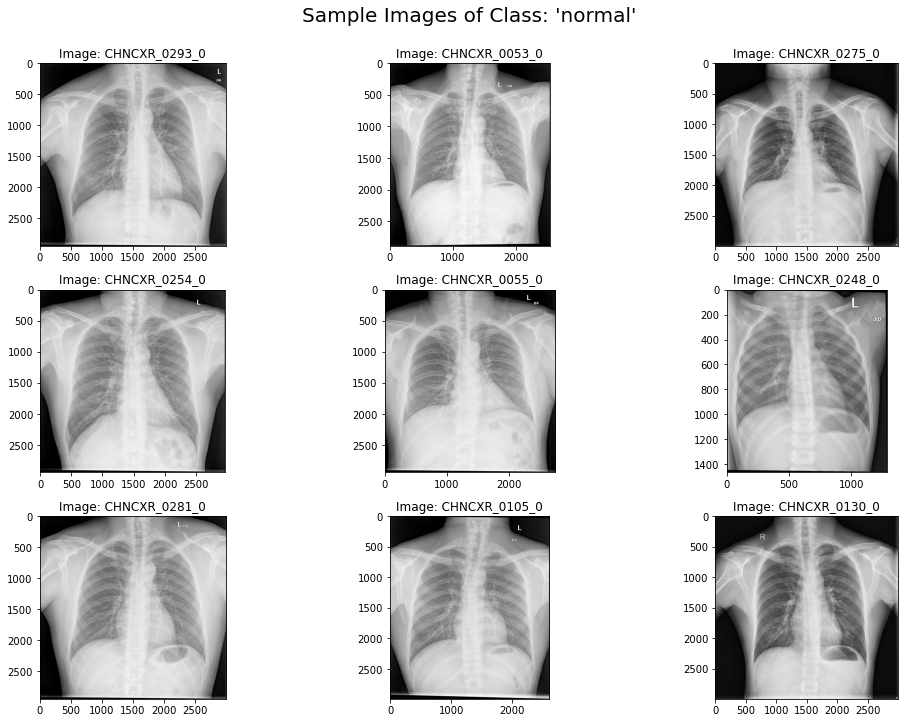

In [11]:
plot_images(normal_data, "normal") # plotting normal x-rays

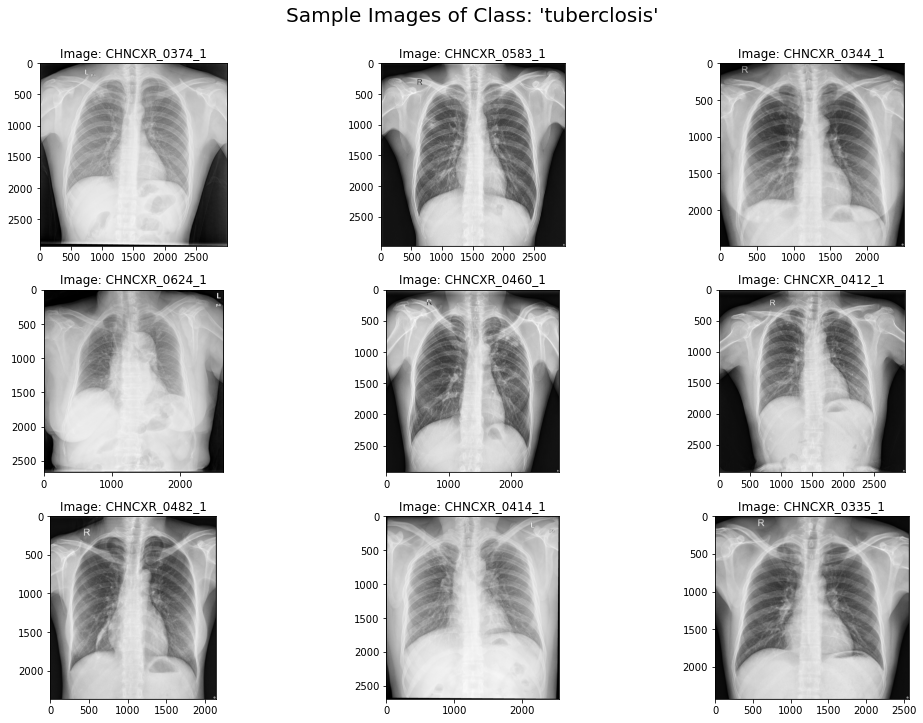

In [12]:
plot_images(tuberclosis_data, "tuberclosis") # plotting tuberclosis diagnosed x-rays

From the samples shown above it can be observed that most of the x-rays that are affected with Tuberclosis are darker in the lungs region. Now a model(AE/VAE/GAN) can be created to produce similar 'normal' and 'tuberclosis' images by feeding the network with the corresponding data.

# <center>Models to Generate New Images </center>

## 1. AUTO-ENCODER

### 1.1 Data Generator

In [12]:
def generator_AE(train_data, batch_size):
    '''Generator to load images. Returns x and y, where x and y are both the same image'''
    def load_image_AE(file, file2):

        img = tf.io.read_file(file)
        img = tf.image.decode_png(img)
        img = tf.image.convert_image_dtype(img, tf.float32)
        img = tf.image.resize(img, (img_rows, img_cols)) # resizing to the required shape

        return img, img

    AUTO = tf.data.experimental.AUTOTUNE
    
    dset = tf.data.Dataset.from_tensor_slices((train_data, train_data))
    dset = dset.shuffle(buffer_size = 100)
    dset = dset.map(load_image_AE, num_parallel_calls = AUTO)
    dset = dset.batch(batch_size)
    dset = dset.prefetch(buffer_size = AUTO)
    dset = dset.repeat()
    
    return dset

In [13]:
BATCH_SIZE = 4
z_dim = 100 # encoder dimension
img_rows = 128
img_cols = 128
channels = 3

In [14]:
# creating generator object
data_gen_ae = generator_AE(data['Filename'].values, BATCH_SIZE)

### 1.2 Model Creation

In [35]:
# AE ENCODER

enc_input = Input(shape = (img_rows, img_cols, channels))

enc = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), padding = "same", 
                       kernel_initializer = tf.keras.initializers.he_uniform())(enc_input)
enc = LeakyReLU(0.2)(enc)

enc = Conv2D(filters = 128, kernel_size = (3,3), strides = (2,2), padding = "same", 
                       kernel_initializer = tf.keras.initializers.he_uniform())(enc)
enc = BatchNormalization(momentum = 0.5)(enc)
enc = LeakyReLU(0.2)(enc)

enc = Conv2D(filters = 256, kernel_size = (3,3), strides = (2,2), padding = "same", 
                       kernel_initializer = tf.keras.initializers.he_uniform())(enc)
enc = BatchNormalization(momentum = 0.5)(enc)
enc = LeakyReLU(0.2)(enc)

enc = Flatten()(enc)

enc = Dense(z_dim, activation='sigmoid', name = 'Encoded_Feature')(enc)

AE_encoder = Model(inputs = enc_input, outputs = enc, name = "AE_Encoder")

The encoder model consists of 3 convolutional layers with leaky relu activation. BatchNormalization is applied after the last two convolutional layers in the model.

In [36]:
# AE DECODER

dec_input = Input(shape=(z_dim,))

decoder = Dense(8*8*128, activation = 'relu')(dec_input)
    
decoder = tf.keras.layers.Reshape((8,8, 128))(decoder)

decoder = Conv2DTranspose(filters = 256, kernel_size = (4,4), strides = (2,2), padding = "same", 
                            kernel_initializer = tf.keras.initializers.he_uniform())(decoder)
decoder = BatchNormalization(momentum = 0.5)(decoder)
decoder = LeakyReLU(0.2)(decoder)

decoder = Conv2DTranspose(filters = 128, kernel_size = (4,4), strides = (2,2), padding = "same", 
                            kernel_initializer = tf.keras.initializers.he_uniform())(decoder)
decoder = BatchNormalization(momentum = 0.5)(decoder)
decoder = LeakyReLU(0.2)(decoder)

decoder = Conv2DTranspose(filters = 64, kernel_size = (4,4), strides = (2,2), padding = "same", 
                            kernel_initializer = tf.keras.initializers.he_uniform())(decoder)
decoder = BatchNormalization(momentum = 0.5)(decoder)
decoder = LeakyReLU(0.2)(decoder)

decoder = Conv2DTranspose(filters = 3, kernel_size = (4,4), activation='tanh' ,strides = (2,2), 
                            padding = "same", kernel_initializer = tf.keras.initializers.he_uniform())(decoder)
AE_decoder = Model(inputs = dec_input, outputs = decoder, name = "AE_Decoder")

The decoder model consists of 4 conv2DTranspose layers with leaky relu activation apart from the last conv2DTranspose layer which uses tanh activation. This is done to make the model consistent with the GAN generator model. He uniform initialization has been used across the model.

In [37]:
# Creating AE model
output_AE = AE_decoder(enc)
AE_model = Model(enc_input, output_AE, name = "Auto-Encoder")

In [38]:
AE_model.summary()

Model: "Auto-Encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 64, 64, 64)        1792      
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
batch_normalization_10 (Batc (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 16, 16, 256)      

### 1.3 Training

In [39]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001) # Adam optimizer used
AE_model.compile('adam', 'mse') # compiled using mean squared error

In [40]:
# since a data generator is used, steps_per_epoch needs to be specified to signal the end of an epoch
history_AE = AE_model.fit(data_gen_ae, epochs = 30, verbose=1, steps_per_epoch = data.shape[0]//BATCH_SIZE)

Epoch 1/30
165/165 [==============================] - 18s 105ms/step - loss: 0.2438
Epoch 2/30
165/165 [==============================] - 17s 103ms/step - loss: 0.0314
Epoch 3/30
165/165 [==============================] - 17s 102ms/step - loss: 0.0273
Epoch 4/30
165/165 [==============================] - 17s 104ms/step - loss: 0.0267
Epoch 5/30
165/165 [==============================] - 17s 103ms/step - loss: 0.0264
Epoch 6/30
165/165 [==============================] - 17s 104ms/step - loss: 0.0262
Epoch 7/30
165/165 [==============================] - 17s 104ms/step - loss: 0.0260
Epoch 8/30
165/165 [==============================] - 17s 103ms/step - loss: 0.02530s - los
Epoch 9/30
165/165 [==============================] - 17s 102ms/step - loss: 0.0261
Epoch 10/30
165/165 [==============================] - 17s 102ms/step - loss: 0.0253
Epoch 11/30
165/165 [==============================] - 17s 102ms/step - loss: 0.0253
Epoch 12/30
165/165 [==============================] - 17s 104ms/s

Text(0.5, 1.0, 'AE Training Summary')

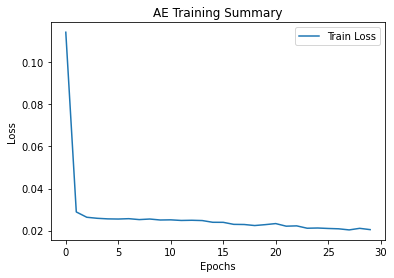

In [47]:
# plotting AE training summary
plt.plot(history_AE.history['loss'], label = 'Train Loss')
plt.legend()
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.title('AE Training Summary')

The model is trained for 30 epochs with a learning rate of 0.0001 and Adam optimizer. As it can be observed from the graph, the training loss is decreasing as the number of epochs increase. There is a sudden decrease in the loss initially after which there is no drastic change. The Model is almost plateauing around the 30th epoch.

### 1.4 Results - Image Generation using Auto Encoder

For generation purpose, a random normal vector is passed to the decoder part of the AE model.

In [41]:
def predict_AE(n_imgs = 9, n_rows = 3, n_cols = 3):
    
    fig = plt.figure(figsize=(15,8))
    
    for i in range(n_imgs):
        # creating random vector
        nom_dist = np.random.normal(0,1,size=(1, z_dim))
        
        # predicting an image using the decoder of the model
        img_pred = AE_decoder.predict(nom_dist)

        fig.add_subplot(n_cols,n_rows,i+1)
        plt.title("AE Image {}".format(i+1))
        plt.imshow(img_pred[0])
    
    plt.tight_layout()
    fig.suptitle("Images Generated by Auto-Encoder Model", y = 1.02, fontsize = 16)

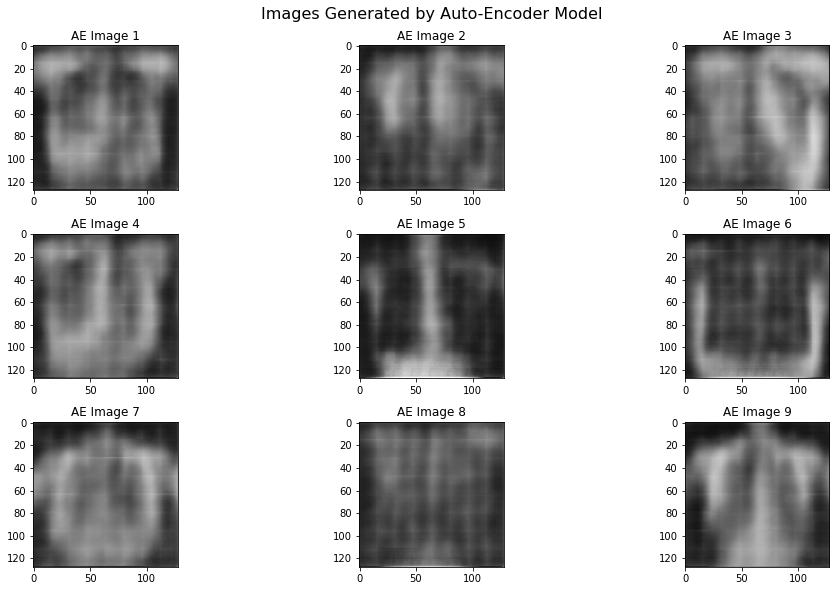

In [30]:
predict_AE() # predicted images using AE

Auto Encoders are not generally used as generator models but it is still able to capture some features of the images in the dataset. All the images generated are blurry and lacks clarity. But there are some images even though blurred and unclear, its shape can be related to the actual shapes in an image in the dataset (Eg: AE Image 1, AE Image 9).

# 2. Variational Auto Encoder

### 2.1 Model Creation

Same architecture used as in Auto-Encoder Model with the adddition of sampling layer.

In [23]:
# code taken from class notes

# custom sampling layer
class Sampling(tf.keras.layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""
    def call(self, inputs):
        # override the inherited .call(self, inputs) method
        z_mean, z_log_var = inputs
        epsilon = tf.keras.backend.random_normal(shape=tf.shape(z_mean)) # N(0, 1)
        
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon # N(mu, sigma)

In [24]:
latent_dim = 16

In [25]:
# VAE ENCODER

enc_input = Input(shape = (img_rows, img_cols, channels))

enc = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), padding = "same", 
                       kernel_initializer = tf.keras.initializers.he_uniform())(enc_input)
enc = LeakyReLU(0.2)(enc)

enc = Conv2D(filters = 128, kernel_size = (3,3), strides = (2,2), padding = "same", 
                       kernel_initializer = tf.keras.initializers.he_uniform())(enc)
enc = BatchNormalization(momentum = 0.5)(enc)
enc = LeakyReLU(0.2)(enc)

enc = Conv2D(filters = 256, kernel_size = (3,3), strides = (2,2), padding = "same", 
                       kernel_initializer = tf.keras.initializers.he_uniform())(enc)
enc = BatchNormalization(momentum = 0.5)(enc)
enc = LeakyReLU(0.2)(enc)

enc = Flatten()(enc)

z_mean = Dense(latent_dim, name="z_mean")(enc)
z_log_var = Dense(latent_dim, name="z_log_var")(enc)
z = Sampling()((z_mean, z_log_var))

VAE_encoder = tf.keras.Model(inputs=enc_input, outputs=z, name="VAE Encoder")

In [26]:
# VAE DECODER

dec_input = Input(shape=(latent_dim,))

decoder = Dense(8*8*128, activation = 'relu')(dec_input)
    
decoder = tf.keras.layers.Reshape((8,8, 128))(decoder)

decoder = Conv2DTranspose(filters = 256, kernel_size = (4,4), strides = (2,2), padding = "same", 
                            kernel_initializer = tf.keras.initializers.he_uniform())(decoder)
decoder = BatchNormalization(momentum = 0.5)(decoder)
decoder = LeakyReLU(0.2)(decoder)

decoder = Conv2DTranspose(filters = 128, kernel_size = (4,4), strides = (2,2), padding = "same", 
                            kernel_initializer = tf.keras.initializers.he_uniform())(decoder)
decoder = BatchNormalization(momentum = 0.5)(decoder)
decoder = LeakyReLU(0.2)(decoder)

decoder = Conv2DTranspose(filters = 64, kernel_size = (4,4), strides = (2,2), padding = "same", 
                            kernel_initializer = tf.keras.initializers.he_uniform())(decoder)
decoder = BatchNormalization(momentum = 0.5)(decoder)
decoder = LeakyReLU(0.2)(decoder)

decoder = Conv2DTranspose(filters = 3, kernel_size = (4,4), activation='tanh' ,strides = (2,2), 
                            padding = "same", kernel_initializer = tf.keras.initializers.he_uniform())(decoder)

VAE_decoder = Model(inputs = dec_input, outputs = decoder, name = "VAE_Decoder")

The Variational Auto Encoder model is created using the same architecture as the AE model with a custom sampling layer in between the encoder and the decoder.

In [27]:
outputs = VAE_decoder(z)
VAE_model = tf.keras.Model(inputs=enc_input, outputs=outputs, name="VAE_model")

In [28]:
# code taken from class notes

reconstruction_loss = tf.keras.losses.mse(enc_input, outputs) # xhat should match x
reconstruction_loss = img_rows * img_cols * K.mean(reconstruction_loss)

kl_loss = -0.5 * tf.reduce_mean(z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)

# Set up losses on the model, and create them as metrics too.
# The Model's loss is the sum of the two losses.
VAE_model.add_loss(kl_loss)
VAE_model.add_metric(kl_loss, name='kl_loss', aggregation='mean')
VAE_model.add_loss(reconstruction_loss)
VAE_model.add_metric(reconstruction_loss, name='mse_loss', aggregation='mean')

### 2.2 Training

In [29]:
opt = tf.keras.optimizers.Adam(learning_rate = 0.0001) # Adam optimizer
VAE_model.compile(opt) # loss already added

In [30]:
VAE_history = VAE_model.fit(data_gen_ae, epochs = 30, verbose=1, steps_per_epoch = data.shape[0]//BATCH_SIZE)

Epoch 1/30
165/165 [==============================] - 18s 103ms/step - loss: 8370.3053 - kl_loss: 819.6695 - mse_loss: 4861.0264
Epoch 2/30
165/165 [==============================] - 17s 104ms/step - loss: 1753.7961 - kl_loss: 35.5765 - mse_loss: 1382.0966
Epoch 3/30
165/165 [==============================] - 17s 104ms/step - loss: 935.0800 - kl_loss: 21.6551 - mse_loss: 827.9995
Epoch 4/30
165/165 [==============================] - 17s 105ms/step - loss: 121907.9209 - kl_loss: 37626.7617 - mse_loss: 614.2360
Epoch 5/30
165/165 [==============================] - 17s 105ms/step - loss: 531.0504 - kl_loss: 15.9607 - mse_loss: 484.6353
Epoch 6/30
165/165 [==============================] - 17s 105ms/step - loss: 402.8993 - kl_loss: 15.6521 - mse_loss: 375.1107
Epoch 7/30
165/165 [==============================] - 17s 105ms/step - loss: 331.8326 - kl_loss: 15.1833 - mse_loss: 306.4212
Epoch 8/30
165/165 [==============================] - 17s 106ms/step - loss: 285.6421 - kl_loss: 14.2924 - 

Text(0.5, 1.0, 'AE Training Summary - MSE Loss')

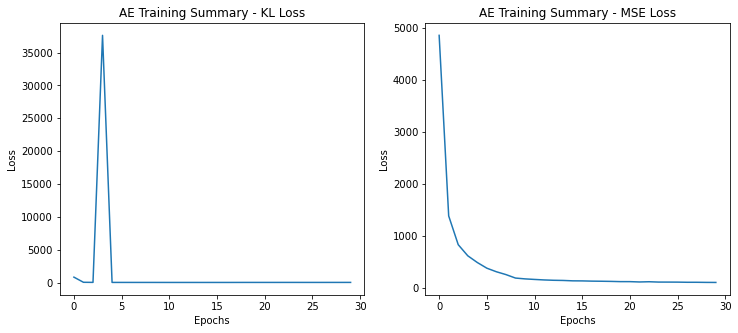

In [81]:
# plotting VAE training summary
fig = plt.figure(figsize=(12,5))
fig.add_subplot(1,2,1)
plt.plot(VAE_history.history['kl_loss'], label = 'KL Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.title('AE Training Summary - KL Loss')
fig.add_subplot(1,2,2)
plt.plot(VAE_history.history['mse_loss'], label = 'MSE Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.title('AE Training Summary - MSE Loss')

The model is trained for 30 epochs with a learning rate of 0.0001 and Adam optimizer. From the training summary it can be observed that the MSE loss and KL loss are both decreasing with increasing epoch values indicative of successful training. There is a sudden spike in the KL loss after 2nd epoch but it starts to decrease again after the next epoch. Both the losses are almost plateauing in and around the 30th epoch.

### 2.3 Results - Image Generation using VAE

For generation purpose, a random normal vector is passed to the decoder part of the VAE model.

In [31]:
def predict_VAE(n_imgs = 9, n_rows = 3, n_cols = 3):
    
    fig = plt.figure(figsize=(15,8))
    
    for i in range(n_imgs):
        
        nom_dist = np.random.normal(0,1,size=(1,latent_dim)) # random normal vector
        img_pred = VAE_decoder.predict(nom_dist) # generating an img using the vector

        fig.add_subplot(n_cols,n_rows,i+1)
        plt.title("VAE Image {}".format(i+1))
        plt.imshow(img_pred[0])

    plt.tight_layout()
    fig.suptitle("Images Generated by the Variational Auto-Encoder Model", y = 1.02, fontsize = 16)

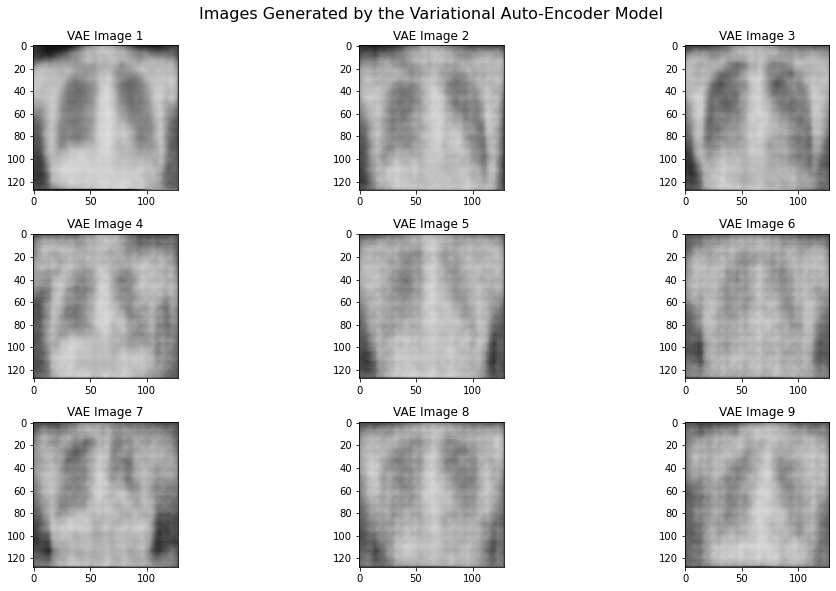

In [58]:
predict_VAE() # generating images

The Variational Auto Encoder is doing a much better job generating images similar to those in the dataset. The images generated are still blurred but images like 'VAE Image 1' and 'VAE Image 2' are good approximations of the actual images. The model is also doing a good job trying to generate colors as similar to the actual x-rays.

# 3. GAN

### 3.1 Data Generator

In [82]:
def load_image(file):
    '''Function to load an image'''
    img = tf.io.read_file(file)
    img = tf.image.decode_png(img)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, (img_rows, img_cols))
    
    return img

def generator(train_data, batch_size):
    '''Data Generator for GAN'''
    AUTO = tf.data.experimental.AUTOTUNE
    
    dset = tf.data.Dataset.from_tensor_slices((train_data))
    dset = dset.shuffle(buffer_size = 100)
    dset = dset.map(load_image, num_parallel_calls = AUTO)
    dset = dset.batch(batch_size)
    dset = dset.prefetch(buffer_size = AUTO)
    #dset = dset.repeat() - Infinite dataset not required while training GAN. For loops will be used
    
    return dset

In [83]:
BATCH_SIZE = 4 # setting a batch size of 4

In [84]:
data_gen = generator(data["Filename"], batch_size = BATCH_SIZE)

### 3.2 Model Creation

Same architecture used as in AE and VAE. Only the kernel initializers were changed from he_uniform to glorot_uniform as it was producing relatively better results.

In [85]:
def get_generator(noise_shape):
    '''Function returns the Generator Model of GAN'''
    
    gen_input = Input(shape = (z_dim, )) 
    
    generator = Dense(8*8*128, activation = 'relu')(gen_input)
    
    generator = tf.keras.layers.Reshape((8,8, 128))(generator)

    generator = Conv2DTranspose(filters = 256, kernel_size = (4,4), strides = (2,2), padding = "same", 
                                kernel_initializer = tf.keras.initializers.glorot_uniform())(generator)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
    
    generator = Conv2DTranspose(filters = 128, kernel_size = (4,4), strides = (2,2), padding = "same", 
                                kernel_initializer = tf.keras.initializers.glorot_uniform())(generator)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
    
    generator = Conv2DTranspose(filters = 64, kernel_size = (4,4), strides = (2,2), padding = "same", 
                                kernel_initializer = tf.keras.initializers.glorot_uniform())(generator)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
    
    generator = Conv2DTranspose(filters = 3, kernel_size = (4,4),activation='tanh' ,strides = (2,2), 
                                padding = "same",kernel_initializer = tf.keras.initializers.glorot_uniform())(generator)

    generator_model = Model(inputs = gen_input, outputs = generator)

    generator_model.summary()
    
    return generator_model

In [86]:
def get_discriminator(image_shape=(128,128,3)):
    '''Function returns the compiled Discriminator of GAN'''
    
    dis_input = Input(shape = (img_rows, img_cols, channels))

    discriminator = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), padding = "same", 
                           kernel_initializer = tf.keras.initializers.glorot_uniform())(dis_input)
    discriminator = LeakyReLU(0.2)(discriminator)

    discriminator = Conv2D(filters = 128, kernel_size = (3,3), strides = (2,2), padding = "same", 
                           kernel_initializer = tf.keras.initializers.glorot_uniform())(discriminator)
    discriminator = BatchNormalization(momentum = 0.5)(discriminator)
    discriminator = LeakyReLU(0.2)(discriminator)
 
    discriminator = Conv2D(filters = 256, kernel_size = (3,3), strides = (2,2), padding = "same", 
                           kernel_initializer = tf.keras.initializers.glorot_uniform())(discriminator)
    discriminator = BatchNormalization(momentum = 0.5)(discriminator)
    discriminator = LeakyReLU(0.2)(discriminator)

    discriminator = Flatten()(discriminator)

    discriminator = Dense(1, activation='sigmoid')(discriminator)

    dis_opt = tf.keras.optimizers.Adam(lr=0.0001, beta_1=0.9)
    discriminator_model = Model(inputs = dis_input, outputs = discriminator)
    discriminator_model.compile(loss='binary_crossentropy', optimizer=dis_opt, metrics=['accuracy'])
    discriminator_model.summary()
    return discriminator_model

In [87]:
z_dim = 100 # noise dimension
generator = get_generator(z_dim) # generator and its summary

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
dense_7 (Dense)              (None, 8192)              827392    
_________________________________________________________________
reshape_5 (Reshape)          (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_20 (Conv2DT (None, 16, 16, 256)       524544    
_________________________________________________________________
batch_normalization_25 (Batc (None, 16, 16, 256)       1024      
_________________________________________________________________
leaky_re_lu_30 (LeakyReLU)   (None, 16, 16, 256)       0         
_________________________________________________________________
conv2d_transpose_21 (Conv2DT (None, 32, 32, 128)       5244

In [88]:
discriminator = get_discriminator((img_rows, img_cols, channels)) # discriminator and its summary

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 128, 128, 3)]     0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 64, 64, 64)        1792      
_________________________________________________________________
leaky_re_lu_33 (LeakyReLU)   (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 32, 32, 128)       73856     
_________________________________________________________________
batch_normalization_28 (Batc (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_34 (LeakyReLU)   (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 16, 16, 256)       2951

In [89]:
def show_predicted_images(Gen, noise, epoch):
    '''Function displays the batch_size number of images generated by the generator'''
    
    fake_imgs = Gen.predict(noise) # generating new images using the generator
    
    fig = plt.figure(figsize = (15, 7))
    
    for i in range(BATCH_SIZE):
        
        fig.add_subplot(2, 2, i+1)
        plt.imshow((fake_imgs[i]*255).astype(np.uint8))
        plt.title(f"Image: {i+1}")
    fig.suptitle(f"Epoch: {epoch} - Generated Images", y = 0.99, fontsize = 16)
    plt.tight_layout()
    plt.show()

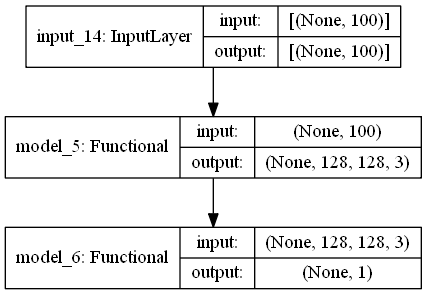

In [90]:
discriminator.trainable = False

# gan optimizer
opt = tf.keras.optimizers.Adam(lr=0.0001, beta_1=0.9)

# Input to the generator
gen_input = Input(shape=z_dim)
GAN_input = generator(gen_input)

GAN_output = discriminator(GAN_input)

# gan model
gan = Model(inputs = gen_input, outputs = GAN_output)
gan.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=['accuracy'])

tf.keras.utils.plot_model(gan, show_shapes=True, show_layer_names=True)

### 3.3 Training

The GAN performance is noted by generating images after every 10 epochs while training.

Epoch: 1 
Discriminator Loss: [0.01121 0.99547] 	 Generator Loss: 1.76905     GAN Accuracy: 0.61329


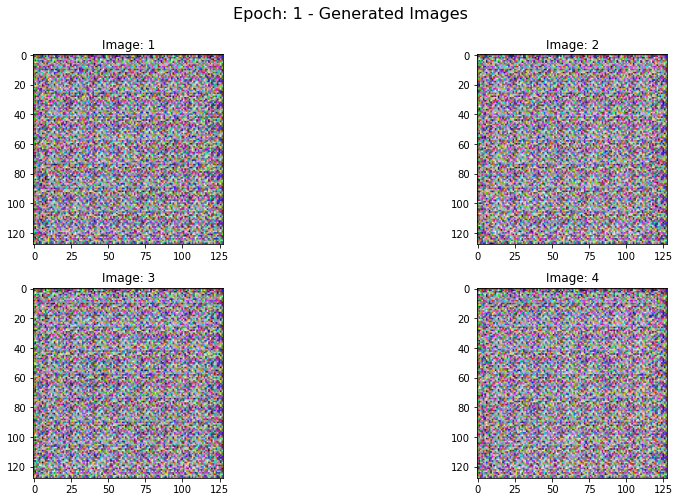

Epoch: 2 
Discriminator Loss: [1.20000e-04 1.00302e+00] 	 Generator Loss: 0.06383     GAN Accuracy: 1.00302
Epoch: 3 
Discriminator Loss: [1.00000e-04 1.00302e+00] 	 Generator Loss: 0.07547     GAN Accuracy: 1.00302
Epoch: 4 
Discriminator Loss: [0.68827 0.9426 ] 	 Generator Loss: 18.10351     GAN Accuracy: 0.59063
Epoch: 5 
Discriminator Loss: [0.57314 0.93202] 	 Generator Loss: 7.21108     GAN Accuracy: 0.62689
Epoch: 6 
Discriminator Loss: [0.0241  0.99849] 	 Generator Loss: 0.76397     GAN Accuracy: 0.96828
Epoch: 7 
Discriminator Loss: [7.70000e-04 1.00302e+00] 	 Generator Loss: 0.00786     GAN Accuracy: 1.0
Epoch: 8 
Discriminator Loss: [1.00000e-04 1.00302e+00] 	 Generator Loss: 0.00361     GAN Accuracy: 1.00151
Epoch: 9 
Discriminator Loss: [7.00000e-05 1.00302e+00] 	 Generator Loss: 0.00221     GAN Accuracy: 1.00302
Epoch: 10 
Discriminator Loss: [5.00000e-05 1.00302e+00] 	 Generator Loss: 0.00109     GAN Accuracy: 1.00302
Epoch: 11 
Discriminator Loss: [3.00000e-05 1.00302e+0

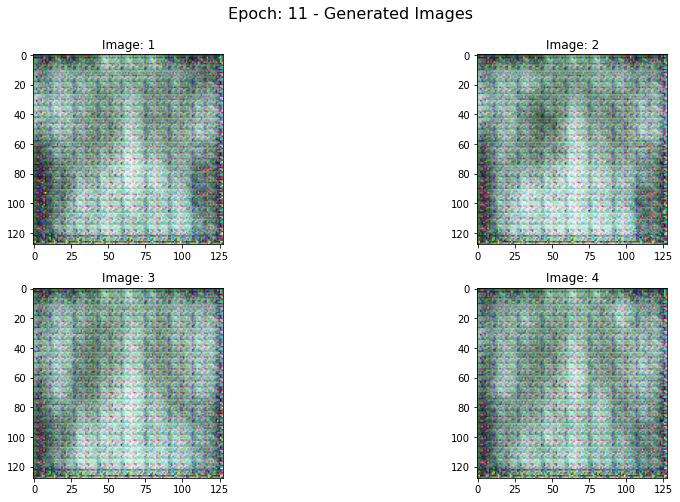

Epoch: 12 
Discriminator Loss: [2.60000e-04 1.00302e+00] 	 Generator Loss: 0.00114     GAN Accuracy: 1.00302
Epoch: 13 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00058     GAN Accuracy: 1.00302
Epoch: 14 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00066     GAN Accuracy: 1.00302
Epoch: 15 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00027     GAN Accuracy: 1.00302
Epoch: 16 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00028     GAN Accuracy: 1.00302
Epoch: 17 
Discriminator Loss: [1.90000e-04 1.00302e+00] 	 Generator Loss: 0.00479     GAN Accuracy: 1.0
Epoch: 18 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00068     GAN Accuracy: 1.00302
Epoch: 19 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00078     GAN Accuracy: 1.00302
Epoch: 20 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00056     GAN Accuracy: 1.00302
Epoch: 21 
Discriminato

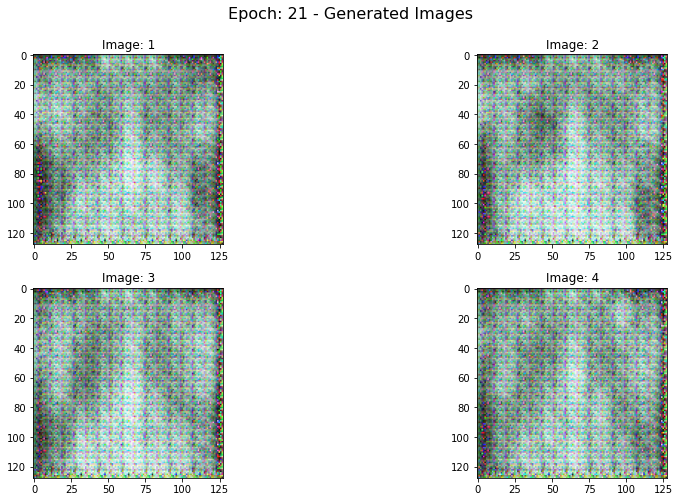

Epoch: 22 
Discriminator Loss: [1.00000e-05 1.00302e+00] 	 Generator Loss: 0.00036     GAN Accuracy: 1.00302
Epoch: 23 
Discriminator Loss: [1.15551 0.94562] 	 Generator Loss: 13.33466     GAN Accuracy: 0.74773
Epoch: 24 
Discriminator Loss: [0.14199 0.98263] 	 Generator Loss: 4.87432     GAN Accuracy: 0.82628
Epoch: 25 
Discriminator Loss: [3.30000e-04 1.00302e+00] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 26 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 27 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 28 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 29 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 30 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 31 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


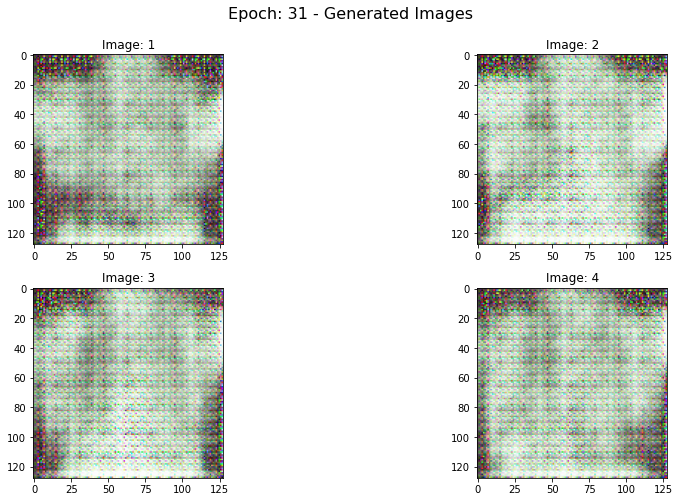

Epoch: 32 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 33 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 34 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 35 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 2e-05     GAN Accuracy: 1.00302
Epoch: 36 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 37 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 38 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 39 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 40 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 41 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


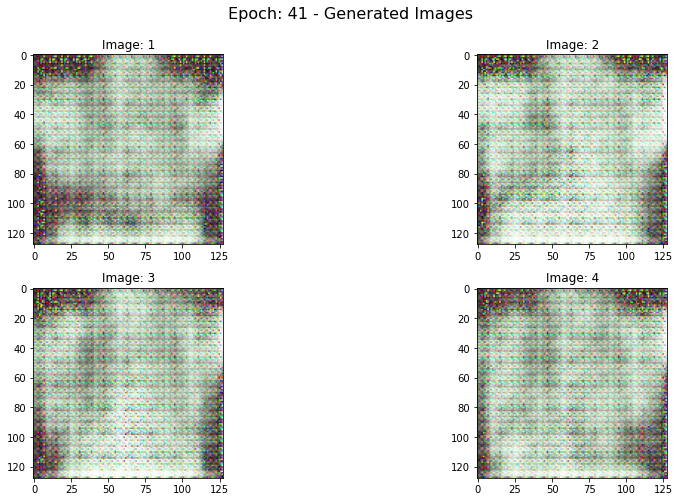

Epoch: 42 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 43 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 44 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 45 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 46 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 47 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 48 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 49 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 50 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 51 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


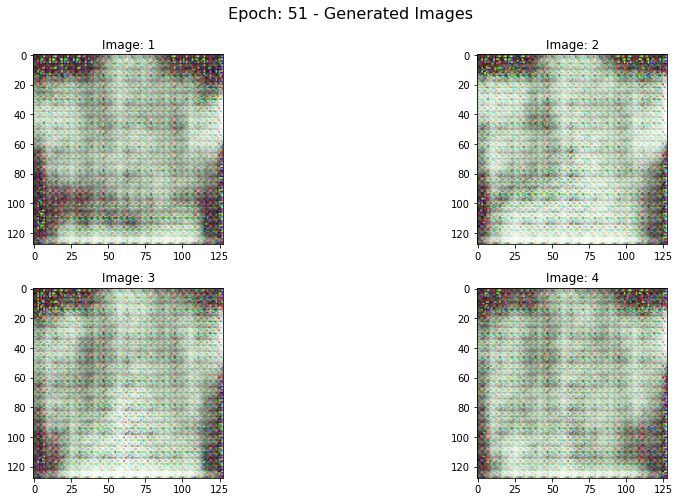

Epoch: 52 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 53 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 2e-05     GAN Accuracy: 1.00302
Epoch: 54 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 55 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 56 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 57 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 58 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 59 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 60 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 61 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302


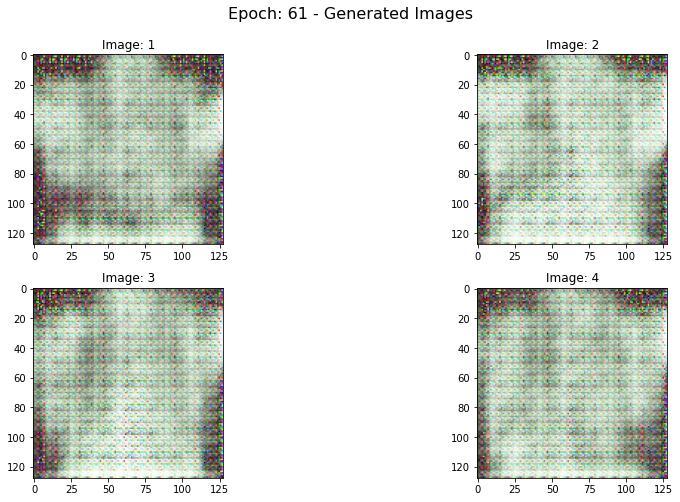

Epoch: 62 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 63 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 64 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 65 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 6e-05     GAN Accuracy: 1.00302
Epoch: 66 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 4e-05     GAN Accuracy: 1.00302
Epoch: 67 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 2e-05     GAN Accuracy: 1.00302
Epoch: 68 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 69 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 70 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 71 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


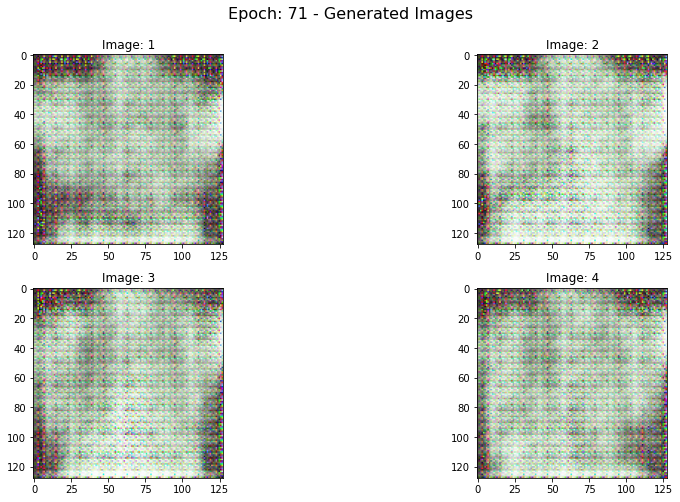

Epoch: 72 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 73 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 74 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 75 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 76 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 77 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 78 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 79 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 80 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 81 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


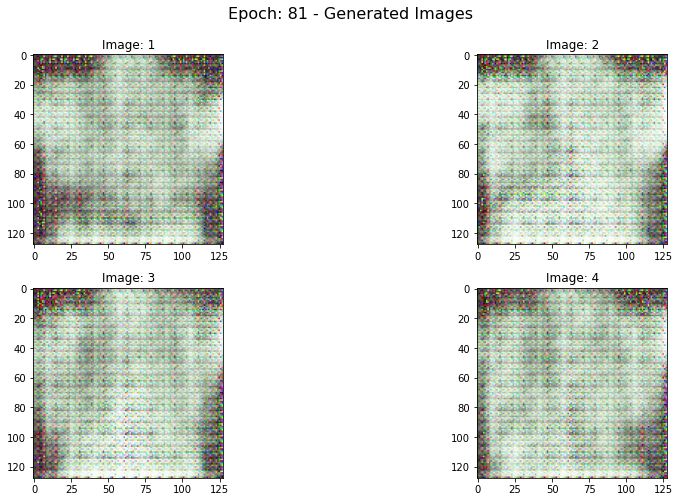

Epoch: 82 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 83 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 84 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 85 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 86 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 87 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 88 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 89 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 90 
Discriminator Loss: [0.49024 0.98716] 	 Generator Loss: 2.60455     GAN Accuracy: 0.94713
Epoch: 91 
Discriminator Loss: [0.00787 1.00151] 	 Generator Loss: 0.09919     GAN Accuracy: 0.99094


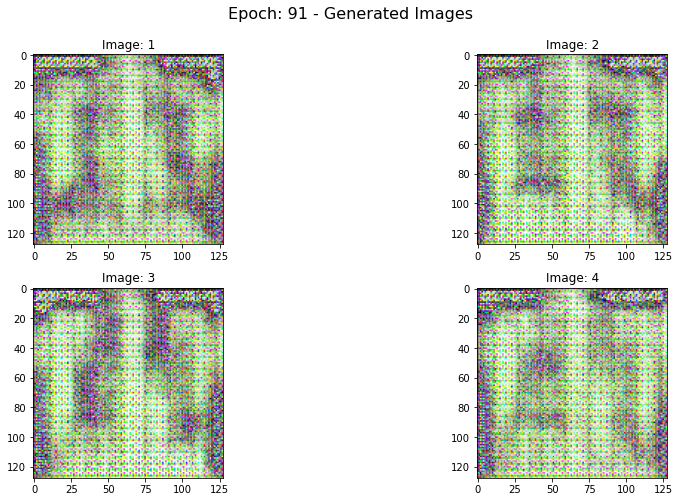

Epoch: 92 
Discriminator Loss: [1.80000e-04 1.00302e+00] 	 Generator Loss: 0.01475     GAN Accuracy: 0.99698
Epoch: 93 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 9e-05     GAN Accuracy: 1.00302
Epoch: 94 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.00024     GAN Accuracy: 1.00302
Epoch: 95 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 7e-05     GAN Accuracy: 1.00302
Epoch: 96 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 97 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 3e-05     GAN Accuracy: 1.00302
Epoch: 98 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.00028     GAN Accuracy: 1.00302
Epoch: 99 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 100 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


In [108]:
# creating random noise vector which will be used to generate images in between epochs
noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

EPOCHS = 100 

# used to store losses
epoch_loss_G = []
epoch_loss_D = []

# for storing accuracy of the model
epoch_acc = []

for epoch in range(EPOCHS):
    
    l_G = 0
    l_D = 0
    
    a_GAN = 0
    
    for images in data_gen:
        
        y_fake = np.ones((len(images), 1)) # fake labels
        y_real = np.zeros((len(images), 1)) # real labels
        
        # creating random noise for training
        z = np.random.normal(0, 1, size=(len(images), z_dim))
        
        x_fake = generator.predict(z) # images generated by Generator using random noise
        x_real = images # real images

        # training Discriminator on fake and real images
        loss_d_real = discriminator.train_on_batch(x_real, y_real)
        loss_d_fake = discriminator.train_on_batch(x_fake, y_fake)
        
        # calculating loss
        loss_d = 0.5 * np.add(loss_d_real[0], loss_d_fake[0])
        
        # adding loss of a batch
        l_D += loss_d        
        
        # training G by training GAN by pretending the noise is real
        loss_g = gan.train_on_batch(z, y_real) 
        l_G += loss_g[0] # gan loss
        a_GAN += loss_g[1] # gan accuracy
        
    epoch_loss_D.append(np.round(l_D/(data.shape[0]/BATCH_SIZE), 5)) # storing loss of an epoch
    epoch_loss_G.append(np.round(l_G/(data.shape[0]/BATCH_SIZE), 5)) 
    
    epoch_acc.append(np.round(a_GAN/(data.shape[0]/BATCH_SIZE), 5)) # storing accuracy of an epoch
    
    # printing epoch summary
    print(f'Epoch: {epoch+1} \nDiscriminator Loss: {epoch_loss_D[epoch]} \t Generator Loss: {epoch_loss_G[epoch]} \
    GAN Accuracy: {epoch_acc[epoch]}')
    
    # generating images after every 10 epochs
    if (epoch) % 10 == 0:
        show_predicted_images(generator, noise, epoch + 1)

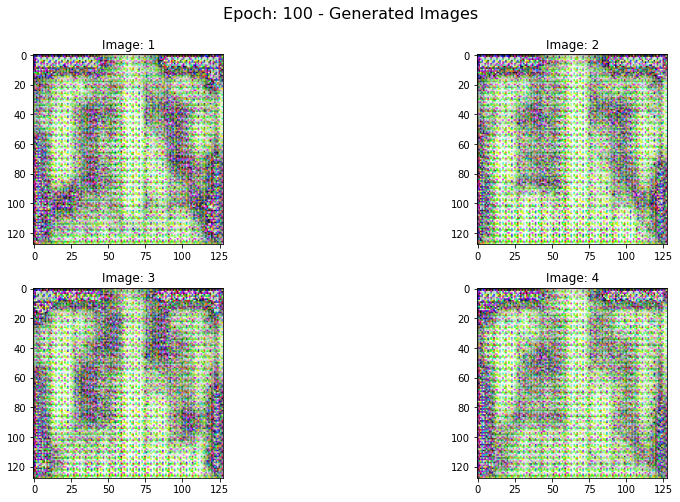

In [109]:
show_predicted_images(generator, noise, epoch + 1) # results after 100 epochs

### Training for another 50 epochs

Epoch: 1 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 2 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 3 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 4 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 5 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 9e-05     GAN Accuracy: 1.00302
Epoch: 6 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 7 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 8 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 9 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 10 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


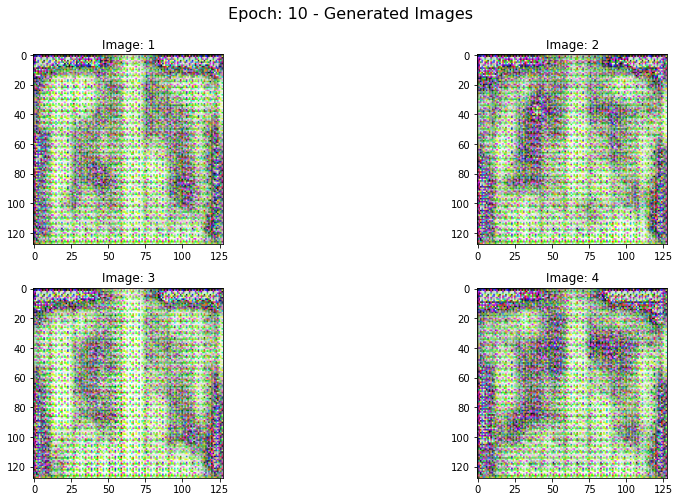

Epoch: 11 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 12 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 13 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 14 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 15 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 16 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 17 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 18 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 19 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 20 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302


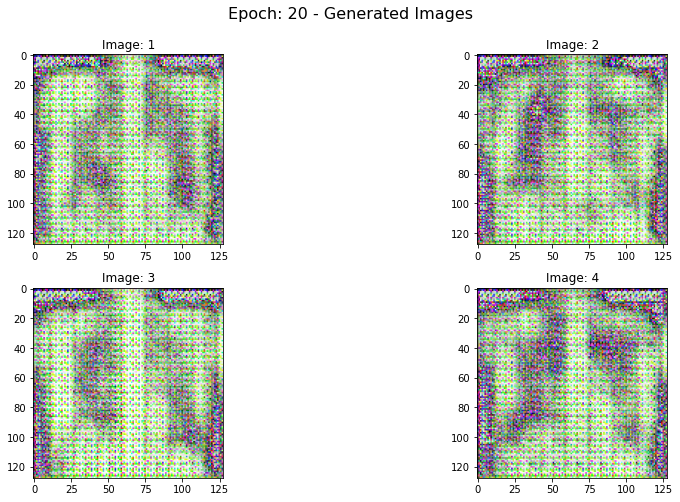

Epoch: 21 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 22 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 23 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 24 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 25 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 26 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 27 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 28 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 29 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 30 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


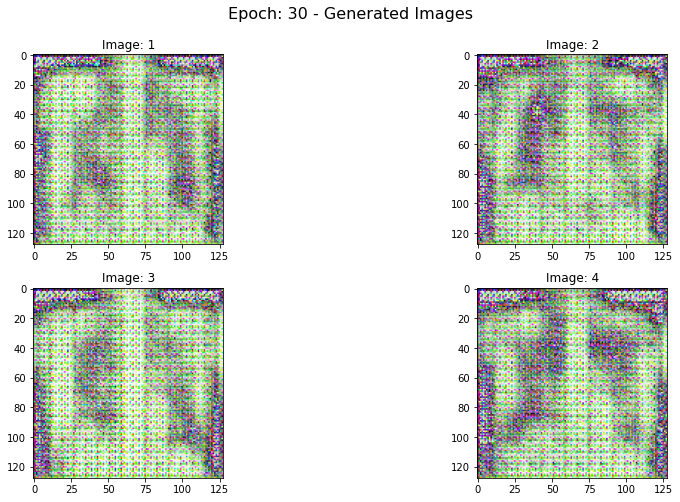

Epoch: 31 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 32 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 33 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 34 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 35 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 36 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 37 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 38 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 39 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 40 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


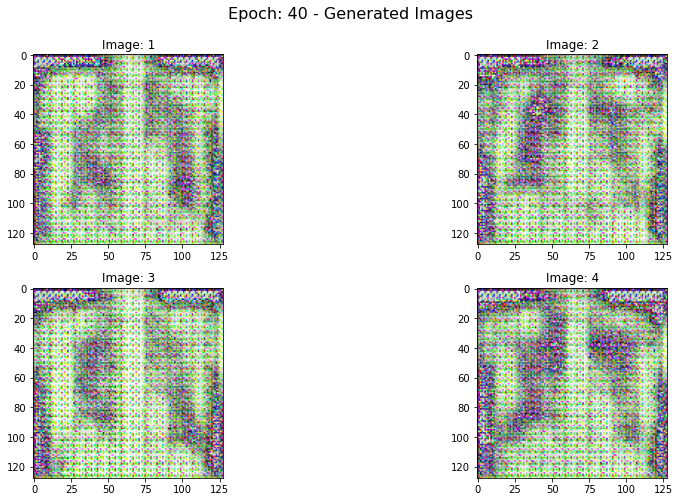

Epoch: 41 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 42 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 43 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 44 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 45 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 46 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 1e-05     GAN Accuracy: 1.00302
Epoch: 47 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 48 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 49 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302
Epoch: 50 
Discriminator Loss: [0.      1.00302] 	 Generator Loss: 0.0     GAN Accuracy: 1.00302


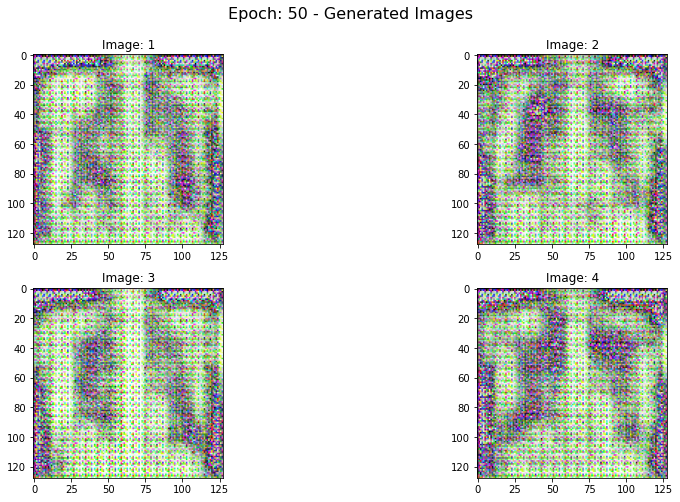

In [112]:
noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim)) # noise used to generate images while testing during epochs

EPOCHS = 100 

# used to store losses
epoch_loss_G = []
epoch_loss_D = []

# for storing accuracy of the model
epoch_acc = []

for epoch in range(EPOCHS):
    
    l_G = 0
    l_D = 0
    
    a_GAN = 0
    
    for images in data_gen:
        
        y_fake = np.ones((len(images), 1)) # fake labels
        y_real = np.zeros((len(images), 1)) # real labels
        
        # creating random noise for training
        z = np.random.normal(0, 1, size=(len(images), z_dim))
        
        x_fake = generator.predict(z) # images generated by Generator using random noise
        x_real = images # real images

        # training Discriminator on fake and real images
        loss_d_real = discriminator.train_on_batch(x_real, y_real)
        loss_d_fake = discriminator.train_on_batch(x_fake, y_fake)
        
        # calculating loss
        loss_d = 0.5 * np.add(loss_d_real, loss_d_fake)
        
        # adding loss of a batch
        l_D += loss_d        
        
        # training G by training GAN by pretending the noise is real
        loss_g = gan.train_on_batch(z, y_real) 
        l_G += loss_g[0] # gan loss
        a_GAN += loss_g[1] # gan accuracy
        
    epoch_loss_D.append(np.round(l_D/(data.shape[0]/BATCH_SIZE), 5)) # storing loss of an epoch
    epoch_loss_G.append(np.round(l_G/(data.shape[0]/BATCH_SIZE), 5)) 
    
    epoch_acc.append(np.round(a_GAN/(data.shape[0]/BATCH_SIZE), 5)) # storing accuracy of an epoch
    
    # printing epoch summary
    print(f'Epoch: {epoch+1} \nDiscriminator Loss: {epoch_loss_D[epoch]} \t Generator Loss: {epoch_loss_G[epoch]} \
    GAN Accuracy: {epoch_acc[epoch]}')
    
    # generating images after every 10 epochs
    if (epoch+1) % 10 == 0:
        show_predicted_images(generator, noise, epoch + 1)

The model was initially trained with a learning rate of 0.0001 and Adam optimizer for 100 epochs. An additional 50 epochs didn't produce any drastic improvement in the model.

GAN is trying to produce more crisp and clear images than that of AE and VAE. It is doing a good job identifying and generating the actual body in the x-ray, focusing less on the background. Even though the generated images have good structure, it can't be compared with the actual images in the dataset. With increasing epoch the model is doing a better job generating the lungs region in the images but no drastic improvement. A better architecture might generate better images. This model technique seems to have good potential in generating quality images than the other two models shown above.

# <center>CONCLUSION</center>

* Among the 3 models trained, the images which were more close to the images in the dataset, with the implemented architecture was generated by the Variational Auto-Encoder Model.
* The VAE took way less epochs to produce such images than the GAN model.
* With a better architecture and with some transfer learning, GANs could be used to produce much better results as it was seen from the training, this technique had more potential.